# Forecasting Hurricane Tracks using Satellite Data Accessed from AWS

When I originally took a crack at forecasting hurricanes with Tensorflow back in 2019, I used Reanalysis data I had to download via ftp and satelitte imagery I webscraped from NASA. It worked well enough, except the reanlysis II data had one major flaw; it was not a perfect mirror for what could be acquired live via NOAA's various other products. Since that time, there's been a major effort by NOAA and other government agencies via the [NOAA Big Data Program](https://www.noaa.gov/organization/information-technology/big-data-program) to move many of both NOAA and NASA's data products to the cloud, both on Amazon AWS and Google Cloud. Many of these datasets span back 3-4 years, and include hourly observations, instead of the 6 hour increments from the reanalysis datasets previously used. Most importantly, however, new observations are added live, in the same format and in the same location, so using a model developed with these datasets could be adapted to live forecasting with minimal effort.

The downside here is that the historic data would ideally cover a longer time period. Our historic track data is every 3 hours, so even if we augment this via interpolation and assume that our hourly interpolated data is accurate enough to use for training, we're still limited in that there were a finite number of storms during this period and there may be several regions of the world that commonly see storms pass through which didn't see one during this period, and therefore our model may not properly learn storm behavoirs in those redions.

Ultimately, down the road we'll probably  want to create a composite training set that includes the previous Reanlysis II data as well, but I wanted to first present a comprehensive methodology for accessing these new datasets, and using them to train Tensorflow models. Adding in the older data for a longer training period is likely to be the next step, and will likely require that we shift which AWS / GCP datasets we draw from to match like with like, but the code to access them should work the same. 

To begin, I'll start with the Geospatial Satellite data from AWS (GEOS16 and 17). The Google data requires a few extra steps to use properly as you need to sign up for a Google Earth Engine account. Google Earth Engine offers a lot of nice features, from the ability to export data into tf.data datasets to being able to use it to directly train hosted models directly on GCP and create high resolution maps including data from other sources fairly easily, but the drawback is that most of the examples are in javascript and assume users will use the javascript browser IDE to pull data. That means some going back and forth from python to js. So, I'm going to start with the AWS data for now, as it allows me to keep everything in a single Jupyter notebook that doesn't rely on premium GCP services to run and is fairly easy follow.

Anyway, Let's begin!

As a starting point, check out this notebook: [Visualize GOES-16 Data from S3](https://github.com/HamedAlemo/visualize-goes16/blob/master/visualize_GOES16_from_AWS.ipynb)

I'll be using some of the code here to get things rolling.

In [63]:
import xarray as xr
import requests
import netCDF4
import boto3
from botocore import UNSIGNED
from botocore.config import Config
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime,timedelta
from tqdm import tqdm
import gc
import os
from IPython.display import Image
import cv2
os.environ['PROJ_LIB'] = r'c:\Users\kylea\AppData\Local\conda\conda\envs\hurricanes\Library\share'

from mpl_toolkits.basemap import Basemap
from pyproj import Proj
import numpy as np
from math import pi

# Initial Dataset
The dataset I'll be using to start is the GEOS16 ABI-L1b-RadF - Advanced Baseline Imager Level 1b (Full Disk). According to [their website](https://www.noaa.gov/organization/information-technology/big-data-program) the Level 1b data is for 16 visible, near-infrared, and infrared spectral bands from .5km to 2km spatial resolution. This code retrieves the file from the S3 bucket associated with the 12th band channel for a given timestamp, which we will later use to along with the second dataset (3-hourly position data for historic storms). GOES makes 4 measurements in each hour for each band. 

The reason for picking this dataset is simple... it covers the longest time period of what's on AWS. In an idea world, we'd want to pull in several of these 'buckets'... most obviously the sea surface temperature, ground temperature, cloud top temperature and derived motion winds. But we only have a couple years for those sets. Once we integrate this with historic reanalysis data for augmented training, we will likely want to bring those into our model, however.

Also, there are 16 bands to choose from within this bucket. Visible and near visible are less than ideal as we see a black disk at night, but there are several bands that show very clear images all night, especially the higher ones, which provide similar views both at night as well as during the day. Ideally, we'd experiment with all possibly combination of these bands to find the ideal mix. For this initial notebook, however, we'll go with band 16, which shows us a 13.27 um wavelength.

Note: L2 derived products are also available for the same timespan. We could use reflectance instead of raw radiance by switching to the L2 dataset, but from some experimentation, I found that the centered hurricane images offered less detail using this approach. It may be worth experimenting with that dataset again as well, but for a first attempt, raw radiance will be used. For more on reflectance vs. radiance, see [here](https://www.l3harrisgeospatial.com/Support/Self-Help-Tools/Help-Articles/Help-Articles-Detail/ArtMID/10220/ArticleID/19247/3377#:~:text=Radiance%20is%20the%20variable%20directly,from%20the%20object%20being%20observed.&text=Reflectance%20is%20the%20ratio%20of,It%20has%20no%20units.).

Additional information regarding the GEOS16 Satellite can be found [here](https://www.goes-r.gov/products/docs/PUG-L2+-vol5.pdf).

In [2]:
bucket_name = 'noaa-goes16'
product_name = 'ABI-L1b-RadF'#'ABI-L2-DMWF'#'ABI-L2-CMIPF'#'ABI-L1b-RadF'#ABI-L2-ACHTF#'ABI-L2-ACTPF'#
year = 2017
day_of_year = 60
hour = 0
band = 14

In [3]:
# Initialize s3 client. 
s3_client = boto3.client('s3', config=Config(signature_version=UNSIGNED))

In [4]:
def get_s3_keys(bucket, s3_client, prefix = ''):
    """
    Generate the keys in an S3 bucket.

    :param bucket: Name of the S3 bucket.
    :param prefix: Only fetch keys that start with this prefix (optional).
    """
    
    kwargs = {'Bucket': bucket}

    if isinstance(prefix, str):
        kwargs['Prefix'] = prefix

    while True:
        resp = s3_client.list_objects_v2(**kwargs)
        for obj in resp['Contents']:
            key = obj['Key']
            if key.startswith(prefix):
                yield key
            

        try:
            kwargs['ContinuationToken'] = resp['NextContinuationToken']
        except KeyError:
            break

In [5]:
print(f'{day_of_year:02.0f}')

60


In [6]:
print(f'{product_name}/{year}/{day_of_year:03.0f}/{hour:02.0f}/OR_{product_name}-M*C{band:02.0f}')
#OR_ABI-L1b-RadF-M6C16_G16

ABI-L1b-RadF/2017/060/00/OR_ABI-L1b-RadF-M*C14


In [7]:
keys = get_s3_keys(bucket_name,
                   s3_client,
                   prefix = f'{product_name}/{year}/{day_of_year:03.0f}/{hour:02.0f}/OR_{product_name}-M3C{band:02.0f}'
                  )
# keys = get_s3_keys(bucket_name,
#                    s3_client)
#                    prefix = f'{product_name}/{year}/{day_of_year:03.0f}/{hour:02.0f}/OR_{product_name}-M3C{band:02.0f}'
#                   )
all_keys= [key for key in keys]
key = all_keys[0] # selecting the first measurement taken within the hour

In [8]:
resp = requests.get(f'https://{bucket_name}.s3.amazonaws.com/{key}')

In [9]:
%%time
file_name = key.split('/')[-1].split('.')[0]
nc4_ds = netCDF4.Dataset(file_name, memory = resp.content)

Wall time: 18 ms


Wall time: 808 ms


(-0.5, 5423.5, 5423.5, -0.5)

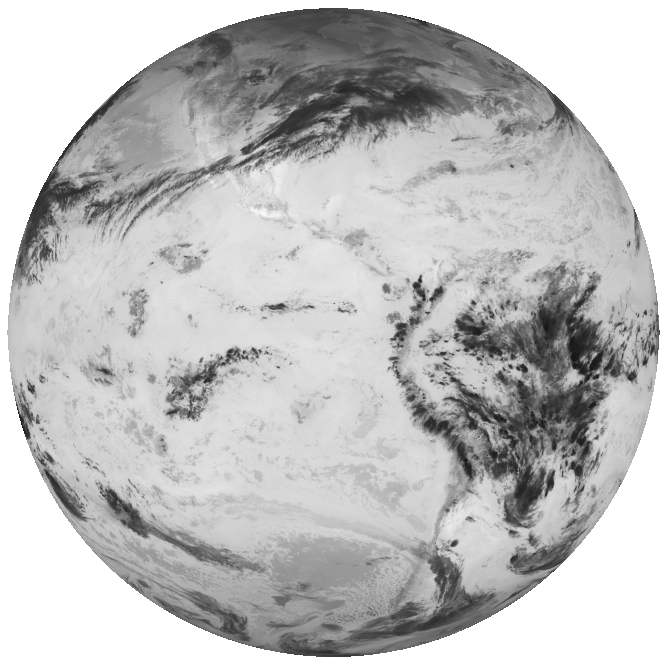

In [10]:
%%time
fig = plt.figure(figsize=(12, 12))
rad=nc4_ds.variables['Rad'][:]
plt.imshow(rad, cmap='gray')
plt.axis('off')
# plt.savefig(f'{file_name}.png', dpi=300, facecolor='w', edgecolor='w',bbox_inches='tight',pad_inches=0,transparent=True)

In [11]:
#Use this if you want to explore the data
#nc4_ds.variables

In [12]:

# Height of the satellite's orbit
height = nc4_ds.variables['goes_imager_projection'].perspective_point_height

# Longitude of the satellite's orbit
lon = nc4_ds.variables['goes_imager_projection'].longitude_of_projection_origin
lat = nc4_ds.variables['goes_imager_projection'].latitude_of_projection_origin

# Which direction do we sweep in?
sweep = nc4_ds.variables['goes_imager_projection'].sweep_angle_axis

X = nc4_ds.variables['x'][:] * height
Y = nc4_ds.variables['y'][:] * height

# g16nc.close()
# g16nc = None

# Zoom
https://stackoverflow.com/questions/14748226/orthographic-projection-python

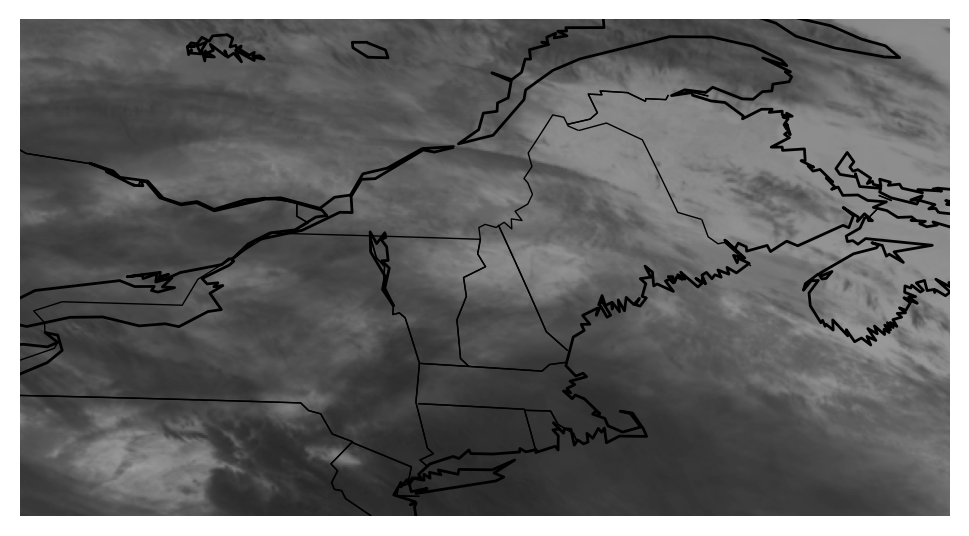

In [13]:
fig = plt.figure(figsize=(6,6),dpi=200)
m = Basemap(resolution='l', projection='geos', lon_0=lon,lat_0=lat,rsphere=(6378137.00,6356752.3142))
#             llcrnrx=X.min(), llcrnry=Y.min(), urcrnrx=X.max(), urcrnry=Y.max())
m.imshow(np.flipud(rad),cmap='gray')
m.drawcountries()
m.drawcoastlines()
m.drawstates()

lllon = -80.
urlon = -60.
lllat = 40.
urlat = 50.

xmin, ymin = m(lllon, lllat)
xmax, ymax = m(urlon, urlat)

ax = plt.gca()

ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
plt.show()

# Tinker with the Formatting
This is cool and all, but I doubt hurricanes care about political boundaries. I could, however, see terrain being a useful feature. Luckily, there's a nice background we can use called "bluemarble" which gives us the clearsky daytime view of the globe, which we should be able to use as a backdrop behind our satellite image data. Remember, we're using sensor data here from outside the visible spectrum, but what we see with is is essentially still the same cloud features, so we should essentially be able to create rough simulations of a daytime view of the hurricane, but during all hours this way. What's more, we can make the clouds semi-transparent, so our AI algorithm will be able to "see" them, while also being able to "see" the terrain features below. So, this will be like looking at the earth with X-ray full color night vision.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


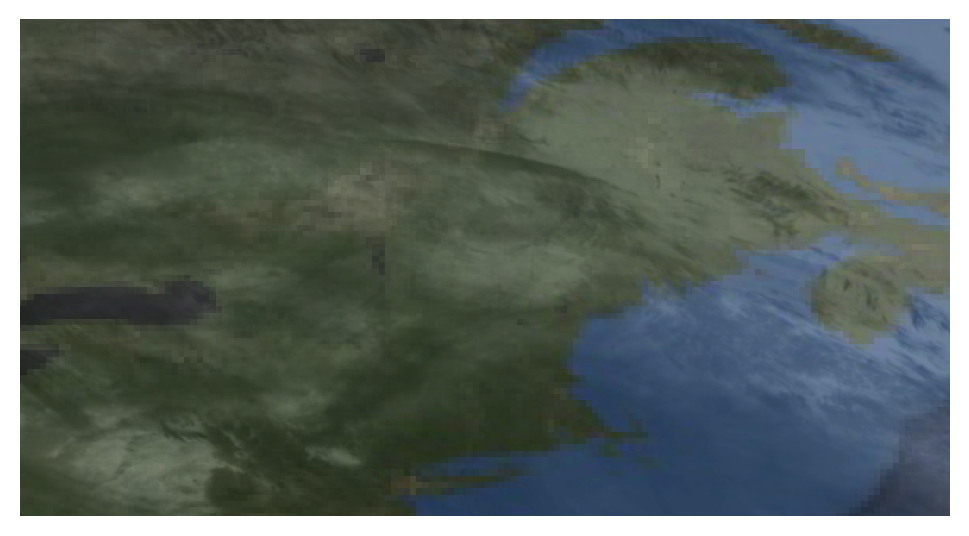

In [14]:
fig = plt.figure(figsize=(6,6),dpi=200)
m = Basemap(resolution='l', projection='geos', lon_0=lon,lat_0=lat,rsphere=(6378137.00,6356752.3142))
#             llcrnrx=X.min(), llcrnry=Y.min(), urcrnrx=X.max(), urcrnry=Y.max())
m.bluemarble()
m.imshow(np.flipud(rad).astype('uint8'),cmap='gray',vmin=0,vmax=100,alpha=0.5); #make it black / white

lllon = -80.
urlon = -60.
lllat = 40.
urlat = 50.

xmin, ymin = m(lllon, lllat)
xmax, ymax = m(urlon, urlat)

ax = plt.gca()

ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
plt.show()

# Make this into a function
We'll want square images ideally, centered around where the storm currently is located. So let's get some scaling factors calculated and make a version of the above that returns an image that we can either save or show. Then, we can interate through our track data and generate centered images for each track position, as well as generate a single full view shot for that timestamp that all active storms during that time will share.

In [15]:
num_lons,num_lats=len(X),len(Y)
min_lon=nc4_ds.variables['geospatial_lat_lon_extent'].geospatial_westbound_longitude
max_lon=nc4_ds.variables['geospatial_lat_lon_extent'].geospatial_eastbound_longitude
min_lat=nc4_ds.variables['geospatial_lat_lon_extent'].geospatial_southbound_latitude
max_lat=nc4_ds.variables['geospatial_lat_lon_extent'].geospatial_northbound_latitude
lat_range=max_lat-min_lat
lon_range=max_lon-min_lon
#range ends up being the same...

In [20]:
def gen_image(m,year=2017,day_of_year=60,hour=0,band=12,margin=10,center_lat=45,center_lon=-70,SID='',my_dpi=200,show=False,save_img=True,show_lines=True):
    gc.collect()
    
    #we use the follow try: except: because apparently at some point during this period, the prefix changes from M3C to M6C. If one fails, try the other.
    try:
        keys = get_s3_keys(bucket_name,
                       s3_client,
                       prefix = f'{product_name}/{year}/{day_of_year:03.0f}/{hour:02.0f}/OR_{product_name}-M3C{band:02.0f}'
                      )
        all_keys= [key for key in keys]
        key = all_keys[0]
    except:
        keys = get_s3_keys(bucket_name,
                       s3_client,
                       prefix = f'{product_name}/{year}/{day_of_year:03.0f}/{hour:02.0f}/OR_{product_name}-M6C{band:02.0f}'
                      )
        all_keys= [key for key in keys]
        key = all_keys[0]        
#     key=next(keys)#just get first key, for first image after the hour.
    resp = requests.get(f'https://{bucket_name}.s3.amazonaws.com/{key}')
    
    file_name = key.split('/')[-1].split('.')[0]
    g16nc = netCDF4.Dataset(file_name, memory = resp.content)
    

    height = g16nc.variables['goes_imager_projection'].perspective_point_height

    # Longitude of the satellite's orbit
#     lon = g16nc.variables['goes_imager_projection'].longitude_of_projection_origin
#     lat = g16nc.variables['goes_imager_projection'].latitude_of_projection_origin

    # Which direction do we sweep in?
#     sweep = g16nc.variables['goes_imager_projection'].sweep_angle_axis

    X = g16nc.variables['x'][:] * height
    Y = g16nc.variables['y'][:] * height
    rad=g16nc.variables['Rad'][:]
    
    fig=plt.figure(figsize=(300/my_dpi, 300/my_dpi), dpi=my_dpi);
#     fig = plt.figure(figsize=(6,6),dpi=200)
#     m = Basemap(resolution='l', projection='geos', lon_0=lon,lat_0=lat,rsphere=(6378137.00,6356752.3142));
    #             llcrnrx=X.min(), llcrnry=Y.min(), urcrnrx=X.max(), urcrnry=Y.max())
#     m.fillcontinents(color='coral',lake_color='aqua')

    if show_lines:
#         m.drawlsmask()
        m.bluemarble();
#         m.drawcountries()
#         m.drawcoastlines()
#         m.drawstates()
    im=m.imshow(np.flipud(rad).astype('uint8'),cmap='gray',vmin=0,vmax=100,alpha=0.5); #make it black / white

    lllon = center_lon-margin
    urlon = center_lon+margin
    lllat = center_lat-margin
    urlat = center_lat+margin

    xmin, ymin = m(lllon, lllat)
    xmax, ymax = m(urlon, urlat)
    xrange=xmax-xmin
    yrange=ymax-ymin
    xcenter=(xmin+xmax)/2
    ycenter=(ymin+ymax)/2
    usable_range=min(xrange,yrange)
    xmin=xcenter-usable_range/2
    xmax=xcenter+usable_range/2
    ymin=ycenter-usable_range/2
    ymax=ycenter+usable_range/2
    ax = plt.gca();

    ax.set_xlim([xmin, xmax]);
    ax.set_ylim([ymin, ymax]);
    if save_img:
        plt.axis('off');
        centered_filename=rf"./storm_centered/centered_{SID}_{year}{day_of_year}{hour}.png"
        plt.savefig(centered_filename, bbox_inches='tight',pad_inches=0,transparent=True);
    if show:
        plt.show()
    plt.close(fig) #memory leak if you don't close fig
    return im

In [17]:
%%time
m = Basemap(resolution='l', projection='geos', lon_0=lon,lat_0=lat,rsphere=(6378137.00,6356752.3142));

Wall time: 1.57 s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


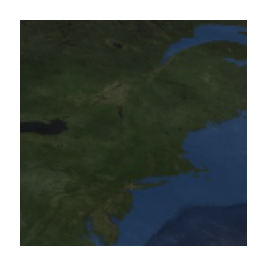

Wall time: 4.02 s


In [21]:
%%time
im=gen_image(m,show=True,save_img=False)

# Historic Track Data / Aux Data Feature Engineering
The NHC offers best track data, but only for named storms near the U.S., and positions are only every 6 hours. This may be where we'll have to tie into later on to pull latest known position of active storms to make live forecasts, but for training data, I prefer this resource:

https://www.ncdc.noaa.gov/ibtracs/index.php?name=ib-v4-access
1.  Knapp, K. R., M. C. Kruk, D. H. Levinson, H. J. Diamond, and C. J. Neumann, 2010:
The International Best Track Archive for Climate Stewardship (IBTrACS): Unifying tropical cyclone best track data.
Bulletin of the American Meteorological Society, 91, 363-376.
non-gonvernment domain doi:10.1175/2009BAMS2755.1
1.  Knapp, K. R., H. J. Diamond, J. P. Kossin, M. C. Kruk, C. J. Schreck, 2018:
International Best Track Archive for Climate Stewardship (IBTrACS) Project, Version 4. [indicate subset used]. NOAA National Centers for Environmental Information. non-gonvernment domain https://doi.org/10.25921/82ty-9e16 [access date].


Note: the full historic csv file from the above site is >100MB, the GitHub limit. The version on github is filtered to only include records from Jan 1, 2017 onward, and the majority of the unused columns were removed. If you download the full historic track data, rename it to "clean_tracks.csv" and it should still work with the following code, but let me know if there are any issues.

In [94]:
track_data=pd.read_csv('clean_tracks.csv',usecols=['SID','ISO_TIME','LAT','LON','STORM_SPEED','STORM_DIR'],infer_datetime_format=True)
track_data=track_data.replace(' ',np.nan) #a few hunderd blank rows get brought in at the end.
track_data.dropna(inplace=True)
track_data['SID']=track_data['SID'].astype('string')
track_data['ISO_TIME']=pd.to_datetime(track_data['ISO_TIME'])
track_data['LAT']=track_data['LAT'].astype('float16')
track_data['LON']=track_data['LON'].astype('float16')
track_data['STORM_SPEED']=track_data['STORM_SPEED'].astype('int8')
track_data['STORM_DIR']=track_data['STORM_DIR'].astype('int8')
track_data['sin_STORM_DIR']=np.sin(np.deg2rad(track_data['STORM_DIR']))
track_data['cos_STORM_DIR']=np.cos(np.deg2rad(track_data['STORM_DIR']))
track_data['year']=track_data['ISO_TIME'].dt.year

track_data['day_of_year']=track_data['ISO_TIME'].dt.day_of_year
track_data['sin_day_of_year']=np.sin(2*pi*track_data['day_of_year']/364)
track_data['cos_day_of_year']=np.cos(2*pi*track_data['day_of_year']/364)

track_data['hour']=track_data['ISO_TIME'].dt.hour
track_data['sin_hour']=np.sin(2*pi*track_data['hour']/23)
track_data['cos_hour']=np.cos(2*pi*track_data['hour']/23)


<AxesSubplot:>

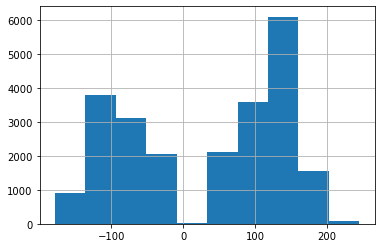

In [95]:
track_data['LON'].hist()

<ipython-input-96-24d42cda5724>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  track_data['LON'][track_data['LON']>180]-=360
<ipython-input-96-24d42cda5724>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  track_data['LON'][track_data['LON']<-180]+=360


<AxesSubplot:>

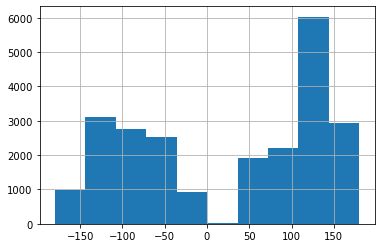

In [96]:
track_data['LON'][track_data['LON']>180]-=360
track_data['LON'][track_data['LON']<-180]+=360
track_data['LON'].hist()

note that I took both the sine and cosine of several cyclical variables here, such as hour, day_of_year, and STORM_DIR. This is because something like a heading of 359 degrees is closer to 1 degree than it is to 350, and 11pm is closer to 1am than it is to 5pm. Latitude is left alone, but I do create a new longitude feature because I notices that there are some potentially aliased values in here (i.e. some longitudes between 180 to 359, and others from -0 to -180). Later on, when we do feature crosses, we want to make sure we're not creating two crosses for the same gridbox.

I use both sine and cosine features here do to the symmetry of sine waves...i.e. the fact that 11pm and 1am would have the exact same value if I only used sine. [This notebook](http://ianlondon.github.io/blog/encoding-cyclical-features-24hour-time/) demonstrates the reasons for using both sine and cosine in more detail.

In [97]:
track_data.dtypes

SID                        string
ISO_TIME           datetime64[ns]
LAT                       float16
LON                       float16
STORM_SPEED                  int8
STORM_DIR                    int8
sin_STORM_DIR             float16
cos_STORM_DIR             float16
year                        int64
day_of_year                 int64
sin_day_of_year           float64
cos_day_of_year           float64
hour                        int64
sin_hour                  float64
cos_hour                  float64
dtype: object

# Labels
This data both be used as input data, but also generate labels. How far out to we want to forecast? Do we only want to look out one timestep (X hours in the future... increment of 3), or do we want to look out several timesteps... say 3,6,9,12 hours?

For now, I'm going to go with the latter approach, but this is something we'll likely wish to revisit. Also, while it may be tempting to build a model that can look out several days, that will seriously limit how much data we have to work with, as we'll only have up until the last timestep that has a valid future forecast point available for each storm. 12 hours as our max seems reasonable.

Also, do we wish to forecast straight latitude and longitude coordinates? This might work, but I suspect that we'll have better luck using some 'differencing' here... i.e. if we forecast the change in latitude and change in longitude. Further, since we'll be doing this for multiple timesteps, each forecasted value should be the difference in latitude and longitude from the previous one, so all outputs are roughly of the same magnitude and our model isn't biased to the longest term forecasts with the greatest changes in position.

In [98]:
track_data.sort_values(['SID','ISO_TIME'],inplace=True)
track_data.reset_index(inplace=True,drop=True)

In [99]:
storm_list=track_data['SID'].drop_duplicates()
dfs=[]
for storm in storm_list:
    temp=track_data[track_data['SID']==storm].copy()
    temp['delta_lat']=temp['LAT'].diff(1)
    temp['delta_lon']=temp['LON'].diff(1)
    for offset in range(1,5):
        temp[f'delta_lat_m{offset*3}']=temp['delta_lat'].shift(-offset)
        temp[f'delta_lon_m{offset*3}']=temp['delta_lon'].shift(-offset)
    temp.drop(columns=['delta_lat','delta_lon'],inplace=True)
    dfs.append(temp)
track_data=pd.concat(dfs)

# Filter by Available GOES Data
Currently oldest datetime

In [100]:
oldest_available=datetime(year=2017,month=1,day=1)+timedelta(days=60)

track_data=track_data[track_data['ISO_TIME']>oldest_available]

In [101]:
track_data.head(-5)

,SID,ISO_TIME,LAT,LON,STORM_SPEED,STORM_DIR,sin_STORM_DIR,cos_STORM_DIR,year,day_of_year,...,sin_hour,cos_hour,delta_lat_m3,delta_lon_m3,delta_lat_m6,delta_lon_m6,delta_lat_m9,delta_lon_m9,delta_lat_m12,delta_lon_m12
406,2017060S09139,2017-03-02 03:00:00,-7.976562,135.125,8,28,0.469482,0.882812,2017,61,...,0.730836,0.682553,0.078125,-0.375,0.054688,-0.250,0.042969,-0.250,0.066406,-0.375
407,2017060S09139,2017-03-02 06:00:00,-7.898438,134.750,6,26,0.438477,0.898926,2017,61,...,0.997669,-0.068242,0.054688,-0.250,0.042969,-0.250,0.066406,-0.375,0.035156,-0.125
408,2017060S09139,2017-03-02 09:00:00,-7.843750,134.500,6,24,0.406738,0.913574,2017,61,...,0.631088,-0.775711,0.042969,-0.250,0.066406,-0.375,0.035156,-0.125,-0.035156,-0.250
409,2017060S09139,2017-03-02 12:00:00,-7.800781,134.250,6,25,0.422607,0.906250,2017,61,...,-0.136167,-0.990686,0.066406,-0.375,0.035156,-0.125,-0.035156,-0.250,-0.066406,-0.125
410,2017060S09139,2017-03-02 15:00:00,-7.734375,133.875,5,25,0.422607,0.906250,2017,61,...,-0.816970,-0.576680,0.035156,-0.125,-0.035156,-0.250,-0.066406,-0.125,-0.050781,-0.250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23396,2021041S25182,2021-02-11 06:00:00,-35.312500,-174.000,13,-124,-0.829102,-0.559082,2021,42,...,0.997669,-0.068242,-0.156250,0.625,0.062500,0.625,NaN,NaN,NaN,NaN
23397,2021041S25182,2021-02-11 09:00:00,-35.468750,-173.375,10,96,0.994629,-0.104797,2021,42,...,0.631088,-0.775711,0.062500,0.625,NaN,NaN,NaN,NaN,NaN,NaN
23398,2021041S25182,2021-02-11 12:00:00,-35.406250,-172.750,10,80,0.984863,0.173462,2021,42,...,-0.136167,-0.990686,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23399,2021048N07133,2021-02-17 06:00:00,6.601562,133.125,9,28,0.469482,0.882812,2021,48,...,0.997669,-0.068242,0.109375,-0.500,0.089844,-0.250,0.058594,0.125,0.039062,0.250


In [102]:
margin=15
track_data=track_data[track_data['LAT']>min_lat+margin]
track_data=track_data[track_data['LAT']<max_lat-margin]
track_data=track_data[track_data['LON']>min_lon+margin]
track_data=track_data[track_data['LON']<max_lon-margin]


In [103]:
track_data.head(-2)

,SID,ISO_TIME,LAT,LON,STORM_SPEED,STORM_DIR,sin_STORM_DIR,cos_STORM_DIR,year,day_of_year,...,sin_hour,cos_hour,delta_lat_m3,delta_lon_m3,delta_lat_m6,delta_lon_m6,delta_lat_m9,delta_lon_m9,delta_lat_m12,delta_lon_m12
1215,2017106N36310,2017-04-16 06:00:00,35.812500,-50.31250,10,-119,-0.875000,-0.484131,2017,106,...,0.997669,-0.068242,-0.375000,0.40625,-0.343750,0.40625,-0.343750,0.40625,-0.343750,0.40625
1216,2017106N36310,2017-04-16 09:00:00,35.437500,-49.90625,10,-119,-0.875000,-0.484131,2017,106,...,0.631088,-0.775711,-0.343750,0.40625,-0.343750,0.40625,-0.343750,0.40625,-0.375000,0.43750
1217,2017106N36310,2017-04-16 12:00:00,35.093750,-49.50000,10,-119,-0.875000,-0.484131,2017,106,...,-0.136167,-0.990686,-0.343750,0.40625,-0.343750,0.40625,-0.375000,0.43750,-0.343750,0.43750
1218,2017106N36310,2017-04-16 15:00:00,34.750000,-49.09375,10,-119,-0.875000,-0.484131,2017,106,...,-0.816970,-0.576680,-0.343750,0.40625,-0.375000,0.43750,-0.343750,0.43750,-0.250000,0.40625
1219,2017106N36310,2017-04-16 18:00:00,34.406250,-48.68750,10,-121,-0.857422,-0.514648,2017,106,...,-0.979084,0.203456,-0.375000,0.43750,-0.343750,0.43750,-0.250000,0.40625,-0.250000,0.40625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22590,2020318N16289,2020-11-17 18:00:00,13.703125,-85.68750,10,15,0.258789,0.965820,2020,322,...,-0.979084,0.203456,0.007812,-0.56250,0.023438,-0.50000,0.031250,-0.50000,0.031250,-0.56250
22591,2020318N16289,2020-11-17 21:00:00,13.710938,-86.25000,10,16,0.275635,0.961426,2020,322,...,-0.519584,0.854419,0.023438,-0.50000,0.031250,-0.50000,0.031250,-0.56250,0.007812,-0.56250
22592,2020318N16289,2020-11-18 00:00:00,13.734375,-86.75000,10,17,0.292236,0.956543,2020,323,...,0.000000,1.000000,0.031250,-0.50000,0.031250,-0.56250,0.007812,-0.56250,-0.007812,-0.62500
22593,2020318N16289,2020-11-18 03:00:00,13.765625,-87.25000,10,18,0.309082,0.951172,2020,323,...,0.730836,0.682553,0.031250,-0.56250,0.007812,-0.56250,-0.007812,-0.62500,NaN,NaN


In [104]:
track_data.reset_index(inplace=True,drop=True)

In [105]:
track_data.to_pickle('track_data.pkl')

# Sample Storm

In [75]:
row=track_data.iloc[1]
print(row)

SID                      2017106N36310
ISO_TIME           2017-04-16 09:00:00
LAT                            35.4375
LON                          -49.90625
STORM_SPEED                         10
STORM_DIR                         -119
sin_STORM_DIR                   -0.875
cos_STORM_DIR                -0.484131
year                              2017
day_of_year                        106
sin_day_of_year               0.966666
cos_day_of_year              -0.256039
hour                                 9
sin_hour                      0.631088
cos_hour                     -0.775711
delta_lat_m3                  -0.34375
delta_lon_m3                   0.40625
delta_lat_m6                  -0.34375
delta_lon_m6                   0.40625
delta_lat_m9                  -0.34375
delta_lon_m9                   0.40625
delta_lat_m12                   -0.375
delta_lon_m12                   0.4375
Name: 1, dtype: object


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


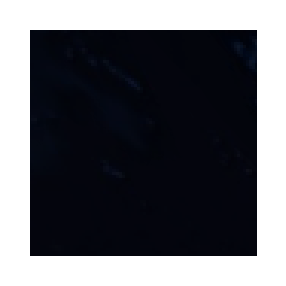

Wall time: 3.23 s


In [76]:
%%time
gen_image(m,year=row['year'],day_of_year=row['day_of_year'],band=8,margin=margin,hour=row['hour'],center_lat=row['LAT'],center_lon=row['LON'],SID=row['SID'],my_dpi=300,save_img=False,show=True,show_lines=True)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


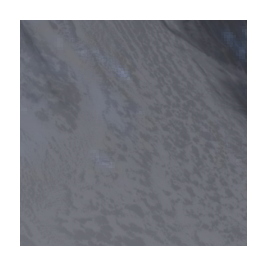

In [77]:
gen_image(m,year=row['year'],day_of_year=row['day_of_year'],band=16,margin=margin,hour=row['hour'],center_lat=row['LAT'],SID=row['SID'],center_lon=row['LON'],my_dpi=200,save_img=False,show=True,show_lines=True)


# Generate Our Images
I rolled this into its own py file so you don't have to run it here, but you can if you want. It takes a few hours. 

Also, be aware, we generate images that we don't have labels for. This is intentional as we may later want to try building models with short forecast windows, or perhaps that use different labels entirely.

In [ ]:
%%time
errors=[]
for i,row in track_data.iterrows():
#     if i>20:
#         break
    print(i)
    try:
        gen_image(m,year=row['year'],day_of_year=row['day_of_year'],band=16,margin=margin,hour=row['hour'],center_lat=row['LAT'],center_lon=row['LON'],SID=row['SID'],my_dpi=300,save_img=True,show_lines=True)
    except:
        print("error: ",row)
#         errors.append(row)
    gc.collect()
error_df=pd.concat(errors,a  xis=1)
error_df.to_pickle('image_gen_errors.pkl')

# Check Out the Errors

In [35]:
import cv2

In [36]:
error_df=pd.read_pickle('image_gen_errors.pkl')
error_df.head()

SID                  2017106N36310
ISO_TIME       2017-04-17 21:00:00
LAT                        32.1875
LON                      -44.96875
STORM_SPEED                      5
dtype: object

In [37]:
print(len(error_df))

1647


Unfortunately, there were a lot of errors processing the storm data. My suspicion is that this is because these were near the edges of the disk. A wider margin might be needed in our filter used earlier. From a manual scan of the generated images, several images also appear to have issues, such as a lot of pixelation, as well as clearly showing the edge of the disk (i.e. the horizon), which shouldn't happen with a projection. Here are a couple examples.

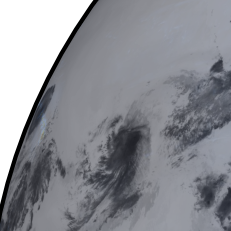

In [38]:
Image(r"./storm_centered/centered_2018244N14252_20182530.png")

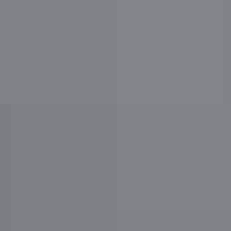

In [39]:
Image(r"./storm_centered/centered_2018300N25315_20183056.png")

In [40]:
problem_storms=error_df['SID'].drop_duplicates()
len(problem_storms)

44

In [78]:
len(track_data['SID'].drop_duplicates())

172

This storm (SID 2018300N25315), did have several errors associated with snapshots in the log, though those images never appear to have generated. Should we remove all these storms, including images that generated successfully, or might there be some usable images in there? Let's look at some samples.

In [42]:
def get_image_from_row(row,COLOR_BGR2RGB=False):
    path=rf"./storm_centered/centered_{row['SID']}_{row['year']}{row['day_of_year']}{row['hour']}.png"
    image = cv2.imread(path)  
    if cv2.COLOR_BGR2RGB:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [79]:
generated_files=pd.Series(os.listdir(r"./storm_centered/"))
track_data['filename']="centered_"+track_data['SID']+"_"+track_data['year'].astype('str')+track_data['day_of_year'].astype('str')+track_data['hour'].astype('str')+".png"
track_data.head()

,SID,ISO_TIME,LAT,LON,STORM_SPEED,STORM_DIR,sin_STORM_DIR,cos_STORM_DIR,year,day_of_year,...,cos_hour,delta_lat_m3,delta_lon_m3,delta_lat_m6,delta_lon_m6,delta_lat_m9,delta_lon_m9,delta_lat_m12,delta_lon_m12,filename
0,2017106N36310,2017-04-16 06:00:00,35.81250,-50.31250,10,-119,-0.875000,-0.484131,2017,106,...,-0.068242,-0.37500,0.40625,-0.34375,0.40625,-0.34375,0.40625,-0.34375,0.40625,centered_2017106N36310_20171066.png
1,2017106N36310,2017-04-16 09:00:00,35.43750,-49.90625,10,-119,-0.875000,-0.484131,2017,106,...,-0.775711,-0.34375,0.40625,-0.34375,0.40625,-0.34375,0.40625,-0.37500,0.43750,centered_2017106N36310_20171069.png
2,2017106N36310,2017-04-16 12:00:00,35.09375,-49.50000,10,-119,-0.875000,-0.484131,2017,106,...,-0.990686,-0.34375,0.40625,-0.34375,0.40625,-0.37500,0.43750,-0.34375,0.43750,centered_2017106N36310_201710612.png
3,2017106N36310,2017-04-16 15:00:00,34.75000,-49.09375,10,-119,-0.875000,-0.484131,2017,106,...,-0.576680,-0.34375,0.40625,-0.37500,0.43750,-0.34375,0.43750,-0.25000,0.40625,centered_2017106N36310_201710615.png
4,2017106N36310,2017-04-16 18:00:00,34.40625,-48.68750,10,-121,-0.857422,-0.514648,2017,106,...,0.203456,-0.37500,0.43750,-0.34375,0.43750,-0.25000,0.40625,-0.25000,0.40625,centered_2017106N36310_201710618.png


In [80]:
potential_problem_images=track_data[(track_data['SID'].isin(error_df['SID'])) & (track_data['filename'].isin(generated_files))]
len(potential_problem_images)

2634

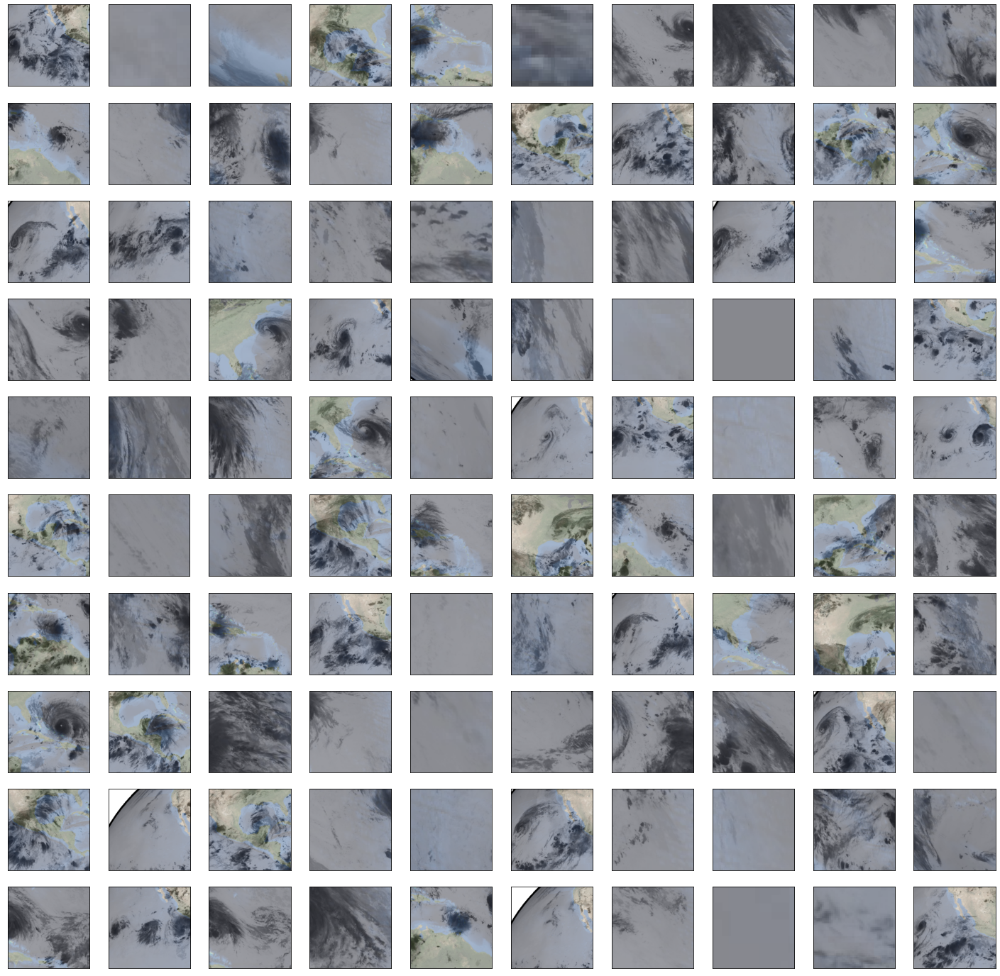

In [81]:
fig = plt.figure(figsize=(25, 25))
for i, (idx, row) in enumerate(potential_problem_images.sample(100, random_state=2021).iterrows()):
    ax = fig.add_subplot(10, 10, i + 1, xticks=[], yticks=[])
    image=get_image_from_row(row)
    plt.imshow(image)

From looking at these 100 samples, it appears that many of these a clear images of storms, though a fairly large number do show the edge of the disc (i.e. the horizon). If we filter out all images associated with storms where at least one of the track images resulted in an error, we would only get 6334 images to work with, as calculated below. The original set of 8962 images is already a bit slimmer than would be ideal, as far as training a neural network goes. Ideally, we'd want tens of thousands of images here, covering as many historic positions as possible.

In [82]:
culled_track_data=track_data[~track_data['SID'].isin(problem_storms)]
len(culled_track_data)

6334

So what can we do here? 

One option would be to manually review all images and remove any that seem suspect from our training data (i.e. where we can't see the telltale swirl pattern of a major tropical storm). We could focus this effort on the subset of images we've flagged, do some more analysis to see if there's another way to screen them a bit better, or be a bit more thorough and go through the whole set. This isn't really as manually intensive as it sounds, as we can pretty quickly scan thumbnails and review them several dozen at a time, so that's what I'm going to do here. It might take a few hours, but that's a task that can rarely be avoided when working with raw data. Every model and feature combination we test down the road will perform much better if we spend more time ensuring the data is high quality. 

An alternative approach (if we were working with significantly more data), would be to manually label a subset of these images... say a couple thousand, and build a basic CNN classifier. We'd then use that classifier to label the rest, doing some Quality Assurance (QA) on the results to ensure accuracy. We relabel any errors we find, add those to the raining set, retrain the model, manually look for errors in the results and repeat until we have an error rate we can live with. There are several cloud services that we could use here that already have this coded up, such as AWS's 'Ground Truth' that makes this quite easy. But, again I'm trying to keep this notebook generic here and platform agnostic. In a later approach, we might dive deeper into either GCP or AWS.

For now, let's just look at a the files a bit closer and see if we might find an easily discernable pattern. 

First, let's look at the filesizes:

<AxesSubplot:>

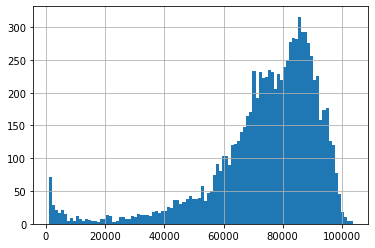

In [83]:
filesizes=[]
for file in generated_files:
    filesizes.append(os.path.getsize(rf"./storm_centered/{file}"))
filesizes=pd.DataFrame(list(zip(generated_files,filesizes)),columns=['filename','size'])
filesizes['size'].hist(bins=100)

Now, let's look at some of the smallest files:

In [84]:
smallest=track_data.merge(filesizes,on='filename')
smallest=smallest[smallest['size']<60000] #60k looks like a nice place to cut this left tail off
len(smallest)

1380

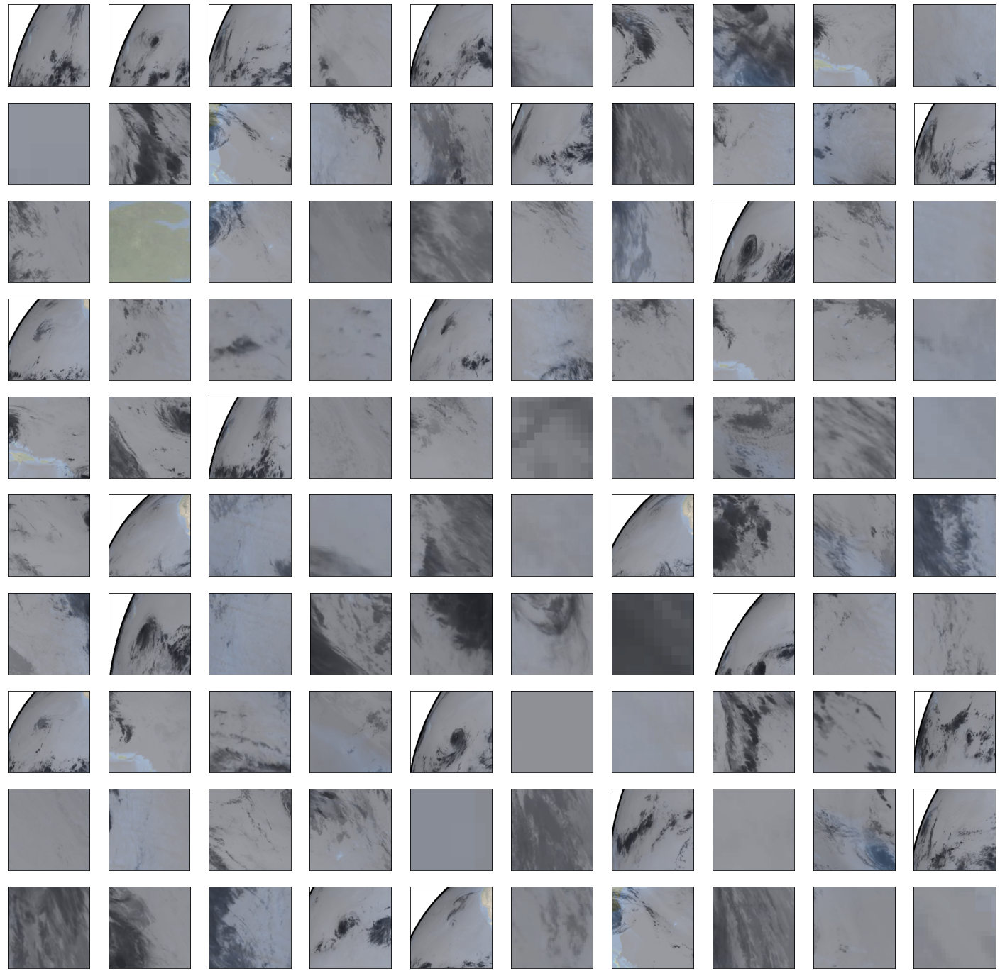

In [85]:
fig = plt.figure(figsize=(25, 25))
for i, (idx, row) in enumerate(smallest.sample(100, random_state=2021).iterrows()):
    ax = fig.add_subplot(10, 10, i + 1, xticks=[], yticks=[])
    image=get_image_from_row(row)
    plt.imshow(image)

Now, let's see if filtering these out gives us what we want. We'll look at a bigger sample (200) to be a bit more sure this gets us what we want.

In [86]:
filtered=track_data.merge(filesizes,on='filename')
filtered=filtered[filtered['size']>=60000] #60k looks like a nice place to cut this left tail off
len(filtered)

7588

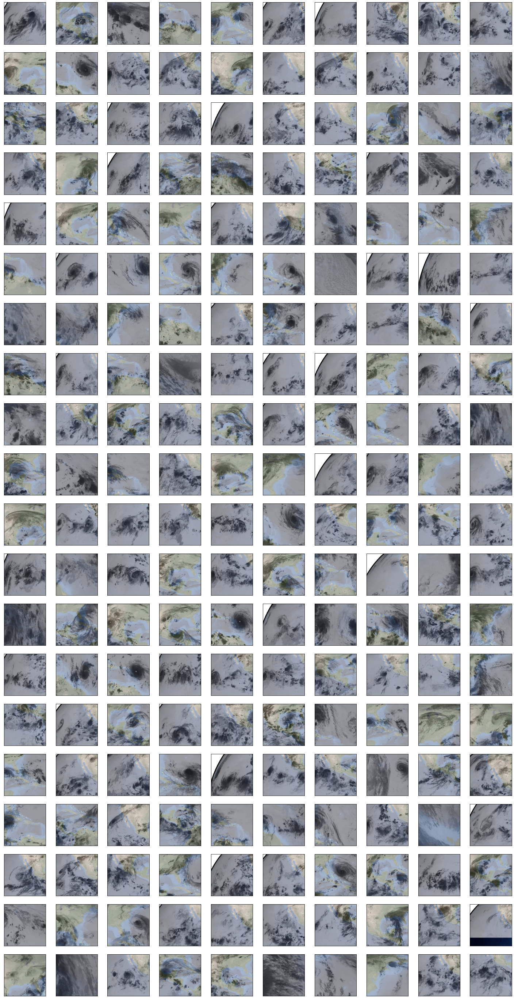

In [87]:
fig = plt.figure(figsize=(25, 50))
for i, (idx, row) in enumerate(filtered.sample(200, random_state=2021).iterrows()):
    ax = fig.add_subplot(20, 10, i + 1, xticks=[], yticks=[])
    image=get_image_from_row(row)
    plt.imshow(image)

This looks pretty good. We could experiment with the threshold some more, but even though there are a handful of images here with the horizon visible, they do appear to capture a lot of detail still. The low blurry pixelated images do appear to be gone, so we'll proceed with this for the time being.

# Model Design
## Baseline Model
Our first model will be simple. We'll use transfer learning via SimpleNet to process the centered image data. The output of this branch of the network will concatenate with a [wide and deep network](https://ai.googleblog.com/2016/06/wide-deep-learning-better-together-with.html), which will process the tabular data. Continuous numerical data (which will feed into the "deep" part of the deep and wide architecture), will include the latitude and longitude of the storm where it is now, the sine of its heading (since 359 degrees is closer to 1 degree than it is 270 degree), and its speed. Discrete / onehot data (for the "wide part) will be provided via tensorflow feature columns, which will bucketize the latitude and longitude coordinates, then do a [feature cross](https://developers.google.com/machine-learning/crash-course/feature-crosses/crossing-one-hot-vectors) to create a onehot grid of locations, only one of which will be our storm's present location. 

Here's a visual representation of a wide and deep network. Remember, we'll be bringing in a third branch for the image processing in addition to the 'wide' and 'deep' portions. We conceivably could just feed this into the 'deep' branch, but using it in its own branch will allow us more flexibility to test different architectures specifically designed to work with image data later.
![wide and deep](https://1.bp.blogspot.com/-Dw1mB9am1l8/V3MgtOzp3uI/AAAAAAAABGs/mP-3nZQCjWwdk6qCa5WraSpK8A7rSPj3ACLcB/s1600/image04.png)

To get started, we're going to have to build a Tensorflow dataset.

In [52]:
import tensorflow as tf

print(tf.__version__)

2.3.0


Using Tensorflow 2.3 here. The current latest is 2.5, but I encountered issues in my environment when using that due to conflicts with some of the dependencies of the other libraries used above. 2.3 has all the features we need. If you're able to use a more current version and encounter any issues, please try downgrading to 2.3.

We'll be using data from the "filtered" dataframe, along with the images referenced by the rows of that dataframe. We'll also filter it to remove any null labels, which we haven't done yet. The following function should handle the preprocessing of that data for us and load the needed image data as well.

In [88]:
filtered.dropna(inplace=True)
filtered.head(-5)

,SID,ISO_TIME,LAT,LON,STORM_SPEED,STORM_DIR,sin_STORM_DIR,cos_STORM_DIR,year,day_of_year,...,delta_lat_m3,delta_lon_m3,delta_lat_m6,delta_lon_m6,delta_lat_m9,delta_lon_m9,delta_lat_m12,delta_lon_m12,filename,size
0,2017106N36310,2017-04-16 06:00:00,35.812500,-50.31250,10,-119,-0.875000,-0.484131,2017,106,...,-0.375000,0.40625,-0.343750,0.40625,-0.343750,0.40625,-0.343750,0.40625,centered_2017106N36310_20171066.png,63453
1,2017106N36310,2017-04-16 09:00:00,35.437500,-49.90625,10,-119,-0.875000,-0.484131,2017,106,...,-0.343750,0.40625,-0.343750,0.40625,-0.343750,0.40625,-0.375000,0.43750,centered_2017106N36310_20171069.png,62132
41,2017130N09269,2017-05-09 18:00:00,9.296875,-91.18750,6,35,0.573730,0.819336,2017,129,...,0.101562,-0.31250,0.101562,-0.18750,0.101562,-0.18750,0.101562,-0.12500,centered_2017130N09269_201712918.png,93380
42,2017130N09269,2017-05-09 21:00:00,9.398438,-91.50000,5,36,0.587891,0.809082,2017,129,...,0.101562,-0.18750,0.101562,-0.18750,0.101562,-0.12500,0.085938,-0.12500,centered_2017130N09269_201712921.png,93855
43,2017130N09269,2017-05-10 00:00:00,9.500000,-91.68750,4,41,0.656250,0.754395,2017,130,...,0.101562,-0.18750,0.101562,-0.12500,0.085938,-0.12500,0.109375,-0.18750,centered_2017130N09269_20171300.png,92336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8954,2020318N16289,2020-11-16 21:00:00,13.539062,-82.68750,8,21,0.358398,0.933594,2020,321,...,0.062500,-0.43750,0.054688,-0.37500,0.046875,-0.37500,0.007812,-0.43750,centered_2020318N16289_202032121.png,97382
8955,2020318N16289,2020-11-17 00:00:00,13.601562,-83.12500,8,22,0.374756,0.927246,2020,322,...,0.054688,-0.37500,0.046875,-0.37500,0.007812,-0.43750,-0.007812,-0.50000,centered_2020318N16289_20203220.png,95785
8956,2020318N16289,2020-11-17 03:00:00,13.656250,-83.50000,8,21,0.358398,0.933594,2020,322,...,0.046875,-0.37500,0.007812,-0.43750,-0.007812,-0.50000,-0.007812,-0.43750,centered_2020318N16289_20203223.png,96176
8957,2020318N16289,2020-11-17 06:00:00,13.703125,-83.87500,8,17,0.292236,0.956543,2020,322,...,0.007812,-0.43750,-0.007812,-0.50000,-0.007812,-0.43750,0.007812,-0.43750,centered_2020318N16289_20203226.png,97190


In [89]:
filtered.columns

Index(['SID', 'ISO_TIME', 'LAT', 'LON', 'STORM_SPEED', 'STORM_DIR',
       'sin_STORM_DIR', 'cos_STORM_DIR', 'year', 'day_of_year',
       'sin_day_of_year', 'cos_day_of_year', 'hour', 'sin_hour', 'cos_hour',
       'delta_lat_m3', 'delta_lon_m3', 'delta_lat_m6', 'delta_lon_m6',
       'delta_lat_m9', 'delta_lon_m9', 'delta_lat_m12', 'delta_lon_m12',
       'filename', 'size'],
      dtype='object')

Before we do our train / test split, we need to figure out which columns we wish to use. We already did some feature engineering when we imported the track data, such as taking the sine and cosine of several cyclical columns, like hour of day, storm heading, etc., so at this point, it's just planning next steps and selecting what we want.
1.  SID: there are hundreds of these, and will be many more if we figure out how to bring in more historic data. We can onehot encode them, but that will add a couple hundred columns, which isn't too bad, but we may as well also encode these via either an 'embedding' or a 'hashed' feature to be more efficient. We can experiment with both, but will start with the embedding approach, since an embedding layer many enable it to learn associations in a continuous space between similarly tracked storms. And if we continue to train our model as we gain new data, it may learn that a currently active storm is behaving similarly to one from the historic record, thus helping with later forecasts as the storm gains maturity. This may or may not end up being useful, and if it is useful, it likely won't help much until well into a storm's life cycle. But it's easy enough to pull in and test.
1.  Lat Lon: Latitude is not cyclical in the way longitude is, and with this dataset, we see negative longitudes used instead of   we'll use these directly to feed into the deep network branch, but also bucketize and feature cross them as described above to feed into the wide part. We'll likely want several hundred grid squares here, so we will want to also feed these gridpoints into embedding feature columns as well.
1.  time: we'll discard raw time, as well as year. We don't want to overfit this and providing raw time is an easy way to do that. We do, however, want to learn seasonality and and sort of impacts time of day have. In both instances, we'll want to convert day of year and hour of day with a sine function since December 31st is close to January 1st and 11pm is close to 1am. We can bucketize both as well and feed the buckets to the wide part while feeding the continuous numerical sine values to the deep part.
1.  Storm speed: similar to above, we'll take the raw speed and bring it into the deep network and bucketize it to send to the wide part.
1.  Storm direction: we already preprocessed this by taking the sine of it when we originally imported the csv file, since it was an obvious step. When we define our feature columns, we'll be sure to also bucketizing it as well and treat it like our other variables.
1.  Image data: this is pretty standard and more or less all handled by tensorflow. We may wish to at some point consider some data augmentation, such as slightly rotating images, zooming, etc., but for now, we'll try it raw. I plan to also try this with a capsule network for the image branch, which would prefer the raw images to skewed or rotated ones.
1.  File size: We will have this for live predictions, and it may actually be useful. We'll include it both in its bucketized as well as raw format. This may capture some level of 'meta' data regarding the complexity of the weather patterns and local terrain, which could potentially have some predictive value.

Note: there are other variables that would be nice to include as well such as storm intensity or wind speed. However, this isn't available for all our datapoints in our current datasets. I have no doubt we can pull this in from alternative sources in a future model, along with other features, like pressure and temperature.

In [64]:
filtered['sin_hour']=np.sin(2*pi*filtered['hour']/23)


# Train / Val / Test Split
We also need to split our dataset into parts. With Time Series data, which this arguably is, there is some debate around the best way to do this. Essentially, common best practice is to keep the oldest data as the training set, the period directly after as validation (to tell when to stop training and prevent overfitting, mostly), and the most current is the test set. Once you have an architecture that works well, you do one last training run with all the data included so that your live forecasts are as solid as possible. 

In the case of our data, however, we have a cleaner way to do this. The reason for the above way of splitting data is mostly that time series data commonly contains 'lagged' variables... that is past historic track locations, or something to that effect. And if you just randomly sample from your entire pool of data to generate your validation or test sets, you model may already have gained sufficient insight into those datapoints from the adjacent ones do the presence of these lagged variables, and thus appear to work very well. Then, when you start using it on live data, it fails. This is because method led to overfitting.

In our case, however, I think we can get away with sampling by storm, since each storm track should be independent of other storm tracks (for the most part). There are instances where multiple storms will merge, like what happened with Superstorm Sandy, but those are edge cases and as long as our validation and test sets are sufficiently large, we should be ok even if they include one or two such storms.

Note: we will still likely want to re-train our final model with the full dataset before deploying for live forecasts, but only after we have a sense for number of training epochs and learning rates so we don't overfit, and the only way to do that adequately is with validation and test sets.

In [56]:
all_storms=filtered['SID'].drop_duplicates()
len(all_storms)

163

In [61]:
train_df=filtered[filtered['SID'].isin(all_storms.sample(int(.85*len(all_storms))))]
val_df=filtered[~filtered['SID'].isin(train_df['SID'])].sample(int(.075*len(all_storms)))
test_df=filtered[(~filtered['SID'].isin(train_df['SID'])) & (~filtered['SID'].isin(val_df['SID']))]

In [ ]:
def create_dataset(dataframe, shuffle=True, batch_size=32):
    filenames=dataframe['filename'].copy()
    other_inputs = dataframe[['SID', 'LAT', 'LON', 'STORM_SPEED', 'STORM_DIR',
       'day_of_year', 'hour', 'size']].copy()
    labels = dataframe.pop('target')
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe), labels))
    if shuffle:
    ds = ds.shuffle(buffer_size=len(dataframe))
    ds = ds.batch(batch_size)
    return ds

## Design Improvements / Next Steps
1. Explore different CNN architectures. SimpleNet is one of many.
1. Explore using full disk images both instead of and an addition to the centered views.
1. Bring in Geos17 data and test using it in two ways:
    1. To broaden the area where we can pull historic data from
    2. To narrow the area, but give us two views (stereoscopic) of each storm snapshot.
1. Test capsule networks both with the centered storm views and full disk views. Capsule networks are supposed to capture more information regarding where in an image a specific feature is located, which should make them more suited to this task than a network architecture design for type classification, which would be preferable if we were trting to look at images of storms and classify their severity, for instance.
1. Test using surface temperate and ground temperature data, which is available from GEOS16 and 17, but for a much smaller timeframe. Augment with historic reanlysis data.
1. Test different output types. Make this into a classification problem where we identify which future gridpoint the storm will be located in, instead of its exact center.